<a href="https://colab.research.google.com/github/Dev-ag12/Country_classification/blob/main/Country_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Loading Dataset

In [ ]:
pip install umap-learn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
from sklearn.preprocessing import StandardScaler
from umap import UMAP
import plotly.express as px
from sklearn.metrics import silhouette_samples, silhouette_score
Result = {}#dictionary to store the silhoutte score of various clustering mesthods

In [ ]:
dt=pd.read_csv('Country-data.csv')
y=dt['country']
df=dt.drop(['country'],axis=1)
df

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
1,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
2,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
3,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
4,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200
...,...,...,...,...,...,...,...,...,...
162,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970
163,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500
164,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310
165,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310


In [ ]:
df.describe()

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
count,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000
mean,38.270060,41.108976,6.815689,46.890215,17144.688623,7.781832,70.555689,2.947964,12964.155689
std,40.328931,27.412010,2.746837,24.209589,19278.067698,10.570704,8.893172,1.513848,18328.704809
min,2.600000,0.109000,1.810000,0.065900,609.000000,-4.210000,32.100000,1.150000,231.000000
25%,8.250000,23.800000,4.920000,30.200000,3355.000000,1.810000,65.300000,1.795000,1330.000000
50%,19.300000,35.000000,6.320000,43.300000,9960.000000,5.390000,73.100000,2.410000,4660.000000
75%,62.100000,51.350000,8.600000,58.750000,22800.000000,10.750000,76.800000,3.880000,14050.000000
max,208.000000,200.000000,17.900000,174.000000,125000.000000,104.000000,82.800000,7.490000,105000.000000


In [ ]:
df.isnull().sum()

child_mort    0
exports       0
health        0
imports       0
income        0
inflation     0
life_expec    0
total_fer     0
gdpp          0
dtype: int64

In [ ]:
colors = ['#FF781F','#2D2926','#458B74']

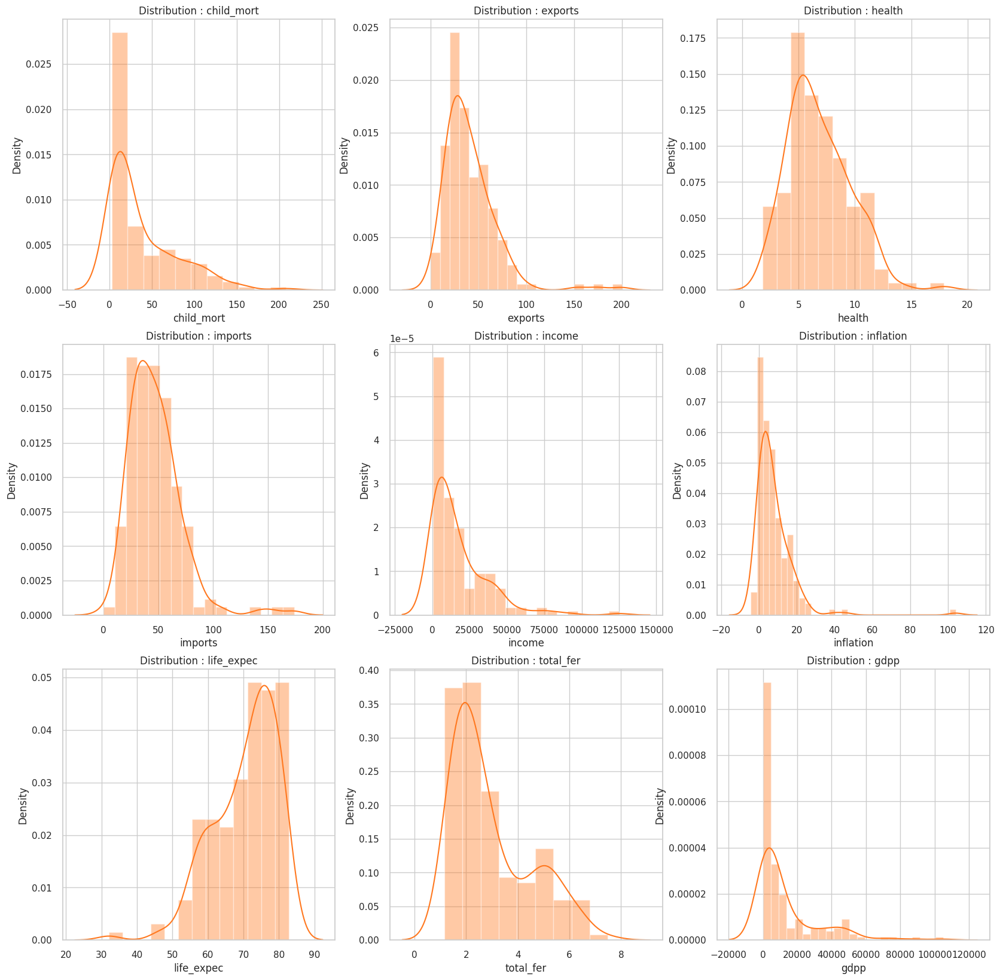

In [ ]:
%%capture --no-display
#distribution of various attributes plotted
fig, ax = plt.subplots(nrows = 3,ncols = 3,figsize = (20,20))
for i in range(len(df.columns)):
    plt.subplot(3,3,i+1)
    sns.distplot(df[df.columns[i]],color = colors[0])
    title = 'Distribution : ' + df.columns[i]
    plt.title(title)
plt.show()

#Scaling the data

In [ ]:
scaler = StandardScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df), columns = df.columns)
df_scaled.describe()
#standardard scaling is applied on data so that clustering algoritms could be done

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
count,1.670000e+02,1.670000e+02,1.670000e+02,1.670000e+02,1.670000e+02,1.670000e+02,1.670000e+02,1.670000e+02,1.670000e+02
mean,-3.722904e-17,2.127373e-16,5.504579e-16,2.765585e-16,-7.977650e-17,-1.063687e-17,3.696311e-16,3.044803e-16,5.850277e-17
std,1.003008e+00,1.003008e+00,1.003008e+00,1.003008e+00,1.003008e+00,1.003008e+00,1.003008e+00,1.003008e+00,1.003008e+00
min,-8.871383e-01,-1.500192e+00,-1.827827e+00,-1.939940e+00,-8.603259e-01,-1.137852e+00,-4.337186e+00,-1.191250e+00,-6.968005e-01
25%,-7.466190e-01,-6.333367e-01,-6.922106e-01,-6.914785e-01,-7.174558e-01,-5.666409e-01,-5.927576e-01,-7.639023e-01,-6.366596e-01
50%,-4.717981e-01,-2.235279e-01,-1.810007e-01,-1.487432e-01,-3.738080e-01,-2.269504e-01,2.869576e-01,-3.564309e-01,-4.544309e-01
75%,5.926666e-01,3.747198e-01,6.515412e-01,4.913530e-01,2.942370e-01,2.816364e-01,7.042584e-01,6.175252e-01,5.942100e-02
max,4.221297e+00,5.813835e+00,4.047436e+00,5.266181e+00,5.611542e+00,9.129718e+00,1.380962e+00,3.009349e+00,5.036507e+00


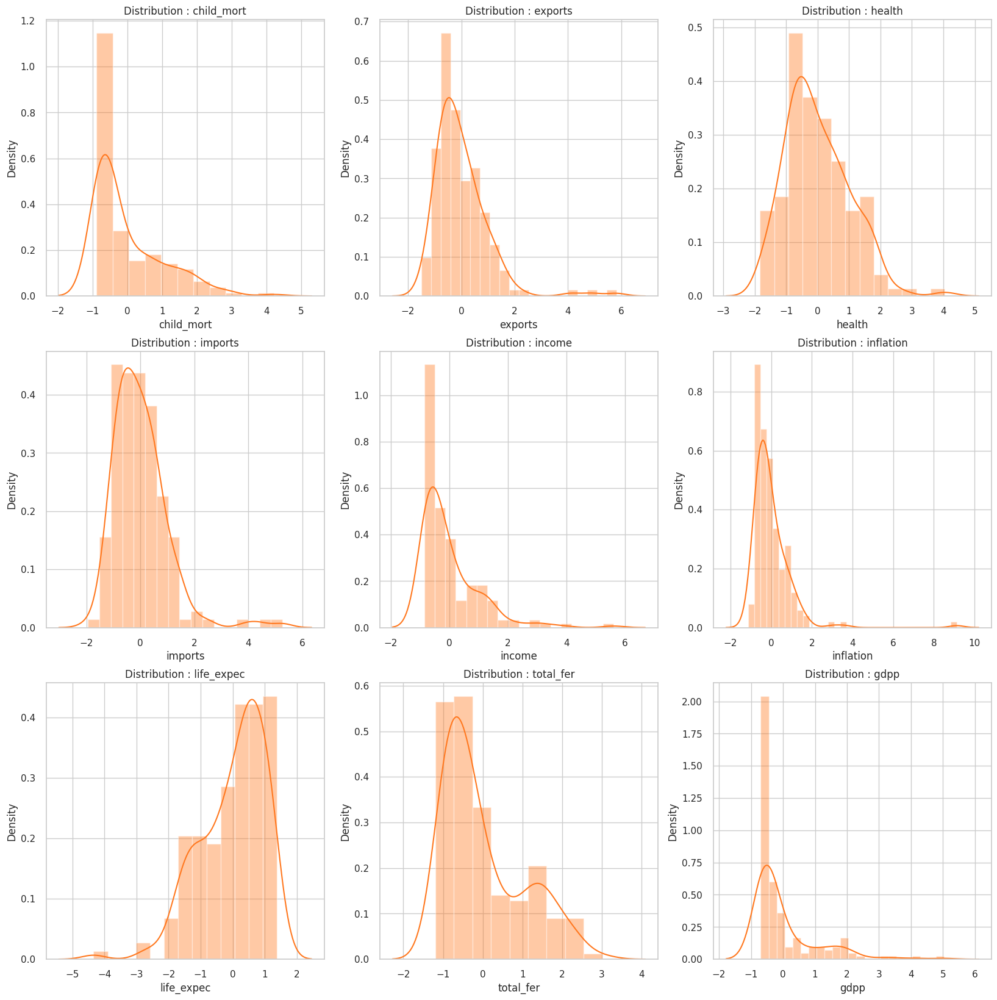

In [ ]:
%%capture --no-display
fig, ax = plt.subplots(nrows = 3,ncols = 3,figsize = (20,20))
for i in range(len(df.columns)):
    plt.subplot(3,3,i+1)
    sns.distplot(df_scaled[df_scaled.columns[i]],color = colors[0])
    title = 'Distribution : ' + df_scaled.columns[i]
    plt.title(title)
plt.show()
#distribution of attributes after scaling

#Studying the corelation

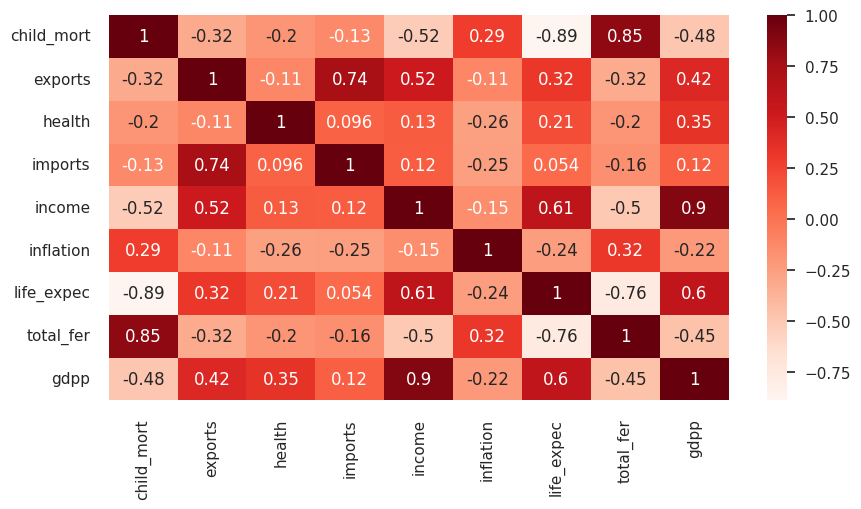

In [ ]:
plt.figure(figsize=(10,5))
cor1 = df_scaled.corr()
sns.heatmap(cor1, annot=True, cmap=plt.cm.Reds)
plt.show()
#heatmap showing corelation of all features plotted

Getting the feature pairs with high corelation

In [ ]:
l=[]
for i in cor1:
  for j in cor1:
    if(abs(cor1[i][j])>=0.70 and i!=j):
      l.append([i,j])
l#getting the features with high corelation

[['child_mort', 'life_expec'],
 ['child_mort', 'total_fer'],
 ['exports', 'imports'],
 ['imports', 'exports'],
 ['income', 'gdpp'],
 ['life_expec', 'child_mort'],
 ['life_expec', 'total_fer'],
 ['total_fer', 'child_mort'],
 ['total_fer', 'life_expec'],
 ['gdpp', 'income']]

In [ ]:
l=[['child_mort', 'life_expec'],
 ['child_mort', 'total_fer'],
 ['exports', 'imports'],
 ['income', 'gdpp']
 ,['life_expec', 'total_fer']
 ]

Scatterplot of features with high corelation

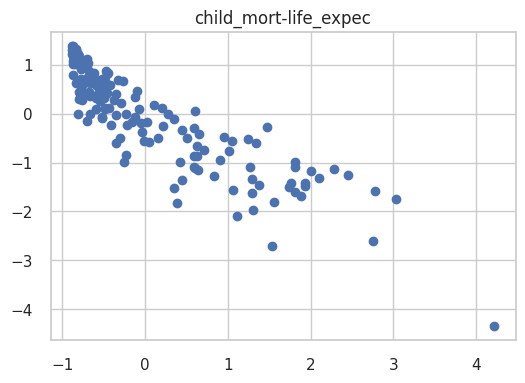

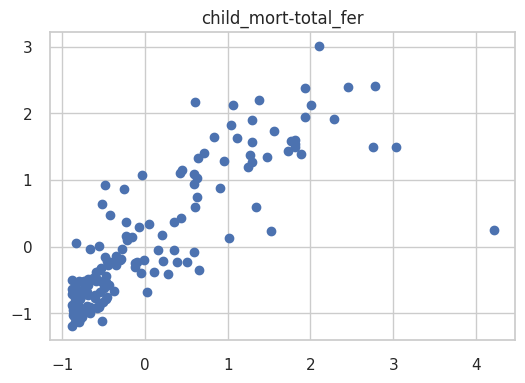

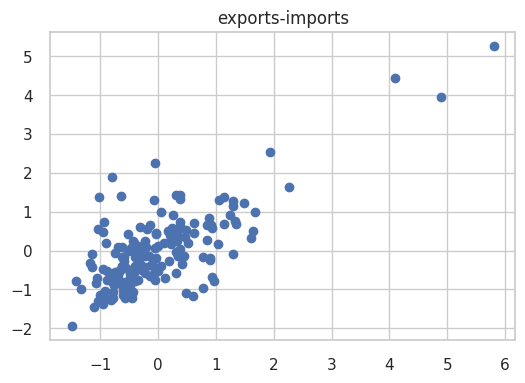

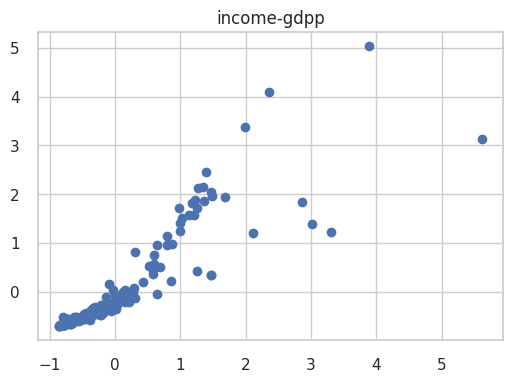

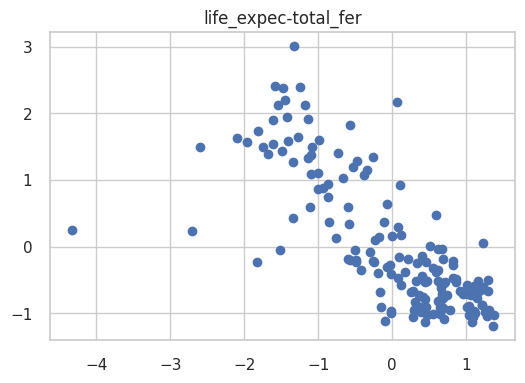

In [ ]:
for i in l:
  plt.figure(figsize=(6,4))
  plt.scatter(df_scaled[i[0]],df_scaled[i[1]])
  plt.title(str(i[0])+ '-'+str(i[1]))
  plt.show()

#K-Means

##On normal scaled data

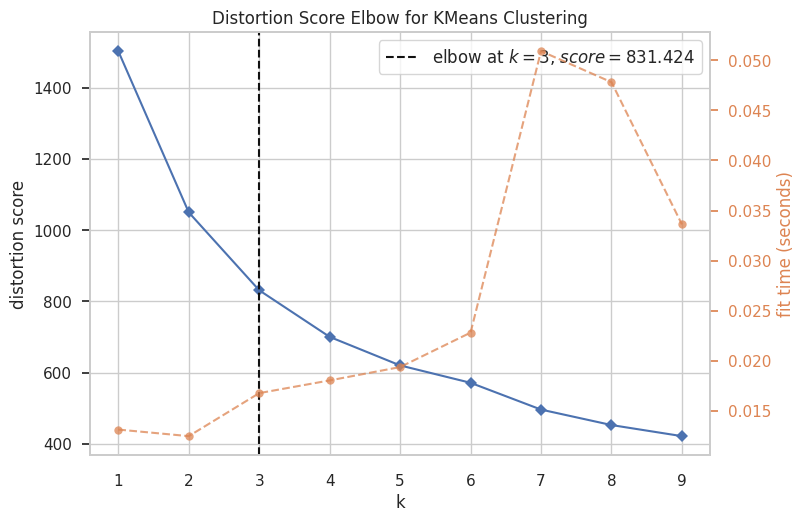

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
model = KMeans(n_init=10)
visualize = KElbowVisualizer(model, k=(1,10))
visualize.fit(df_scaled)
visualize.poof()
#getting appropriate value of k using elbow method

In [ ]:
kmeans = KMeans(n_clusters=3,n_init=10)
df2=df_scaled.copy()
df2["Cluster"] = kmeans.fit_predict(df_scaled)
df2['country']=y
df2
#assingning cluster values to all rows

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,Cluster,country
0,1.291532,-1.138280,0.279088,-0.082455,-0.808245,0.157336,-1.619092,1.902882,-0.679180,0,Afghanistan
1,-0.538949,-0.479658,-0.097016,0.070837,-0.375369,-0.312347,0.647866,-0.859973,-0.485623,2,Albania
2,-0.272833,-0.099122,-0.966073,-0.641762,-0.220844,0.789274,0.670423,-0.038404,-0.465376,2,Algeria
3,2.007808,0.775381,-1.448071,-0.165315,-0.585043,1.387054,-1.179234,2.128151,-0.516268,0,Angola
4,-0.695634,0.160668,-0.286894,0.497568,0.101732,-0.601749,0.704258,-0.541946,-0.041817,2,Antigua and Barbuda
...,...,...,...,...,...,...,...,...,...,...,...
162,-0.225578,0.200917,-0.571711,0.240700,-0.738527,-0.489784,-0.852161,0.365754,-0.546913,2,Vanuatu
163,-0.526514,-0.461363,-0.695862,-1.213499,-0.033542,3.616865,0.546361,-0.316678,0.029323,2,Venezuela
164,-0.372315,1.130305,0.008877,1.380030,-0.658404,0.409732,0.286958,-0.661206,-0.637754,2,Vietnam
165,0.448417,-0.406478,-0.597272,-0.517472,-0.658924,1.500916,-0.344633,1.140944,-0.637754,0,Yemen


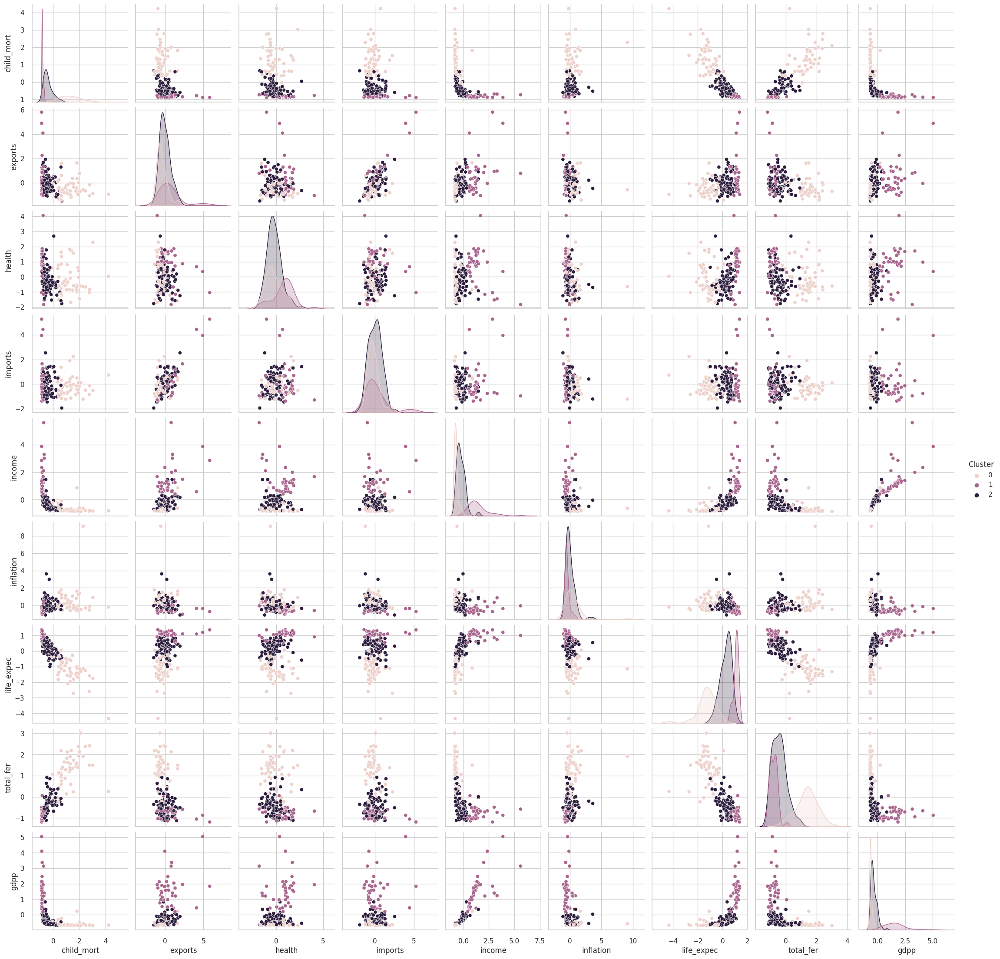

In [ ]:
sns.set(style="whitegrid")
sns.pairplot(df2.drop(['country'],axis=1), hue='Cluster')
#plotting the paiplots

In [ ]:
from sklearn.metrics import silhouette_samples, silhouette_score
score1= silhouette_score(df, kmeans.labels_, metric='euclidean')
print(score1)
Result['KMeans_Normal_Scaled'] = score1
#calculating silhoutte score using sklearn

0.22595133318635627


In [ ]:
umap_2d1=UMAP(n_components=2,init='random',random_state=0)
umap_3d1=UMAP(n_components=3,init='random',random_state=0)
proj_2d1=umap_2d1.fit_transform(df_scaled)
proj_3d1=umap_3d1.fit_transform(df_scaled)
fig_2d1=px.scatter(proj_2d1,x=0,y=1,color=df2.Cluster)
fig_3d1=px.scatter_3d(proj_3d1,x=0,y=1,z=2,color=df2.Cluster)
#plotting the multidimentional data in 2-D using UMAP to visualize the clusters

In [ ]:
fig_2d1.show()

##On PCA data

Applying KMeans Clustering on data that is transformed using PCA

In [ ]:
df_pc=df_scaled.copy()
pca4=PCA()
pca_data4 = pca4.fit_transform(df_pc)
print(pca_data4.shape)
df_pc=pd.DataFrame(pca_data4)
df_pc

(167, 9)


,0,1,2,3,4,5,6,7,8
0,-2.913025,0.095621,-0.718118,1.005255,-0.158310,-0.254597,0.383000,0.415076,-0.014148
1,0.429911,-0.588156,-0.333486,-1.161059,0.174677,0.084579,0.248919,-0.221042,0.173316
2,-0.285225,-0.455174,1.221505,-0.868115,0.156475,-0.401696,-0.087214,-0.184162,0.084037
3,-2.932423,1.695555,1.525044,0.839625,-0.273209,-0.547996,-0.440835,-0.355998,-0.091339
4,1.033576,0.136659,-0.225721,-0.847063,-0.193007,-0.206919,0.241978,-0.023681,0.094270
...,...,...,...,...,...,...,...,...,...
162,-0.820631,0.639570,-0.389923,-0.706595,-0.395748,0.009059,-0.098738,0.521886,-0.497803
163,-0.551036,-1.233886,3.101350,-0.115311,2.082581,0.097274,0.206735,-0.078805,-0.275735
164,0.498524,1.390744,-0.238526,-1.074098,1.176081,0.051607,-0.143627,-0.217590,-0.036522
165,-1.887451,-0.109453,1.109752,0.056257,0.618365,-0.540917,0.060256,0.089495,-0.096049


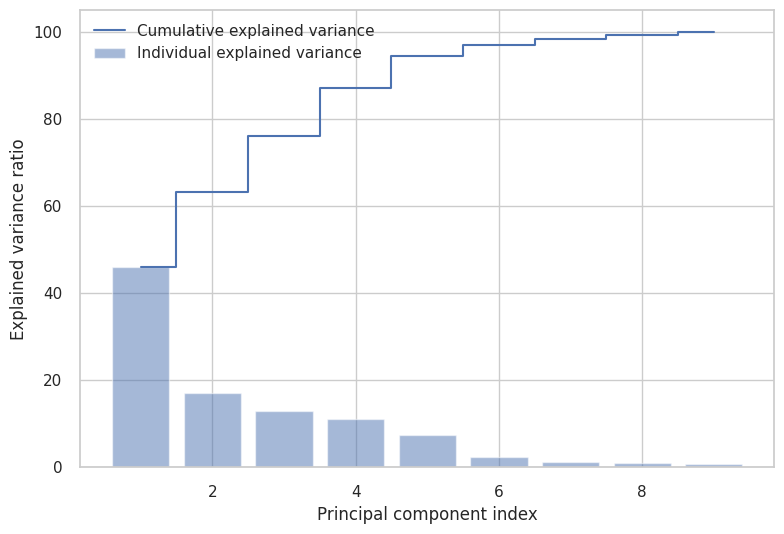

In [ ]:
exp_var_pca = pca4.explained_variance_ratio_
#
# Cumulative sum of eigenvalues; This will be used to create step plot
# for visualizing the variance explained by each principal component.
#
cum_sum_eigenvalues = np.cumsum(exp_var_pca)

#
# Create the visualization plot
#
plt.bar(range(1,len(exp_var_pca)+1), exp_var_pca*100, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(1,len(cum_sum_eigenvalues)+1), cum_sum_eigenvalues*(100), where='mid',label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

In [ ]:
#Taking n_components = 5 as nearly 90% variance is captured
df_pc=df_scaled.copy()
pca4=PCA(n_components=5)
pca_data4 = pca4.fit_transform(df_pc)
print(pca_data4.shape)
df_pc=pd.DataFrame(pca_data4)
df_pc

(167, 5)


,0,1,2,3,4
0,-2.913025,0.095621,-0.718118,1.005255,-0.158310
1,0.429911,-0.588156,-0.333486,-1.161059,0.174677
2,-0.285225,-0.455174,1.221505,-0.868115,0.156475
3,-2.932423,1.695555,1.525044,0.839625,-0.273209
4,1.033576,0.136659,-0.225721,-0.847063,-0.193007
...,...,...,...,...,...
162,-0.820631,0.639570,-0.389923,-0.706595,-0.395748
163,-0.551036,-1.233886,3.101350,-0.115311,2.082581
164,0.498524,1.390744,-0.238526,-1.074098,1.176081
165,-1.887451,-0.109453,1.109752,0.056257,0.618365


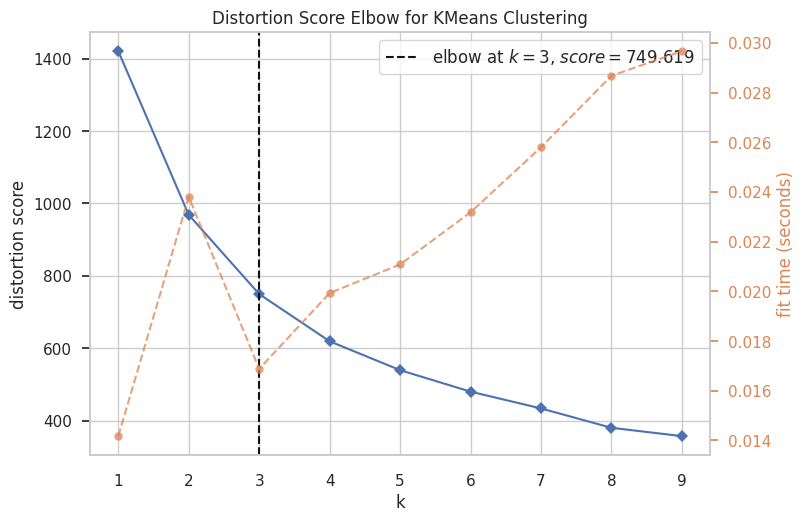

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
model4 = KMeans(n_init=10)
visualize = KElbowVisualizer(model4, k=(1,10))
visualize.fit(df_pc)
visualize.poof()

In [ ]:
kmeans4 = KMeans(n_clusters=3,n_init=10)
df10=df_pc.copy()
df10["Cluster"] = kmeans4.fit_predict(df_pc)
df10['country']=y
df10

,0,1,2,3,4,Cluster,country
0,-2.913025,0.095621,-0.718118,1.005255,-0.158310,1,Afghanistan
1,0.429911,-0.588156,-0.333486,-1.161059,0.174677,2,Albania
2,-0.285225,-0.455174,1.221505,-0.868115,0.156475,2,Algeria
3,-2.932423,1.695555,1.525044,0.839625,-0.273209,1,Angola
4,1.033576,0.136659,-0.225721,-0.847063,-0.193007,2,Antigua and Barbuda
...,...,...,...,...,...,...,...
162,-0.820631,0.639570,-0.389923,-0.706595,-0.395748,2,Vanuatu
163,-0.551036,-1.233886,3.101350,-0.115311,2.082581,2,Venezuela
164,0.498524,1.390744,-0.238526,-1.074098,1.176081,2,Vietnam
165,-1.887451,-0.109453,1.109752,0.056257,0.618365,1,Yemen


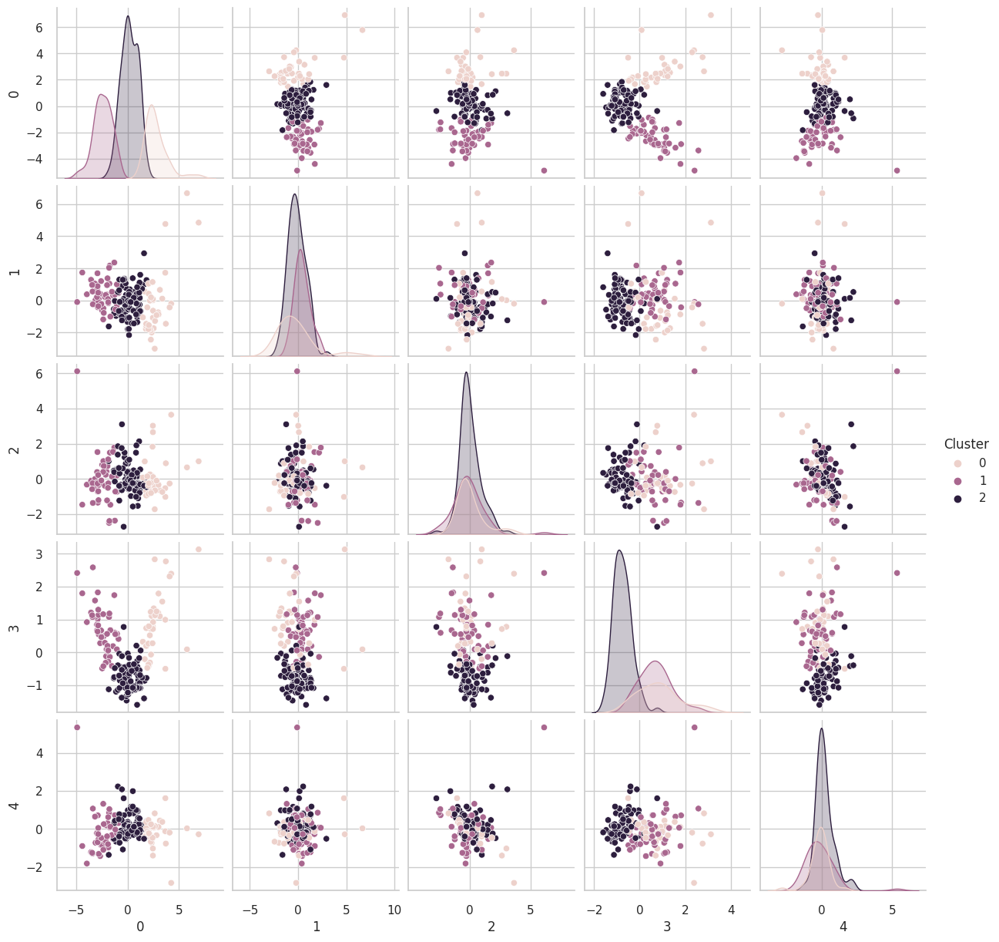

In [ ]:
sns.set(style="whitegrid")
sns.pairplot(df10.drop(['country'],axis=1), hue='Cluster');

In [ ]:
score2= silhouette_score(df_scaled, kmeans4.labels_, metric='euclidean')
print(score2)
Result['KMeans_Normal_Scaled_pca'] = score2

0.28329575683463126


In [ ]:
color=['#000000','#191970','#900C3F']

In [ ]:
umap_2d2=UMAP(n_components=2,init='random',random_state=0)
umap_3d2=UMAP(n_components=3,init='random',random_state=0)
proj_2d2=umap_2d2.fit_transform(df_scaled)
proj_3d2=umap_3d2.fit_transform(df_scaled)

fig_2d2=px.scatter(proj_2d2,x=0,y=1,color=df10.Cluster)
fig_3d2=px.scatter_3d(proj_3d2,x=0,y=1,z=2,color=df10.Cluster)

In [ ]:
fig_2d2.show()

##Data after removing corelated features(Feature Selction)

In [ ]:
l

[['child_mort', 'life_expec'],
 ['child_mort', 'total_fer'],
 ['exports', 'imports'],
 ['income', 'gdpp'],
 ['life_expec', 'total_fer']]

In [ ]:
df_n=df_scaled.copy()
df_n

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,1.291532,-1.138280,0.279088,-0.082455,-0.808245,0.157336,-1.619092,1.902882,-0.679180
1,-0.538949,-0.479658,-0.097016,0.070837,-0.375369,-0.312347,0.647866,-0.859973,-0.485623
2,-0.272833,-0.099122,-0.966073,-0.641762,-0.220844,0.789274,0.670423,-0.038404,-0.465376
3,2.007808,0.775381,-1.448071,-0.165315,-0.585043,1.387054,-1.179234,2.128151,-0.516268
4,-0.695634,0.160668,-0.286894,0.497568,0.101732,-0.601749,0.704258,-0.541946,-0.041817
...,...,...,...,...,...,...,...,...,...
162,-0.225578,0.200917,-0.571711,0.240700,-0.738527,-0.489784,-0.852161,0.365754,-0.546913
163,-0.526514,-0.461363,-0.695862,-1.213499,-0.033542,3.616865,0.546361,-0.316678,0.029323
164,-0.372315,1.130305,0.008877,1.380030,-0.658404,0.409732,0.286958,-0.661206,-0.637754
165,0.448417,-0.406478,-0.597272,-0.517472,-0.658924,1.500916,-0.344633,1.140944,-0.637754


In [ ]:
df_n=df_n.drop(['life_expec','income','exports'],axis=1)
df_n
#dropping 1 feature from each category(finance,trade and health which have high corelation to reduce the dimention)
#hence dropped life_expec,income and exports

,child_mort,health,imports,inflation,total_fer,gdpp
0,1.291532,0.279088,-0.082455,0.157336,1.902882,-0.679180
1,-0.538949,-0.097016,0.070837,-0.312347,-0.859973,-0.485623
2,-0.272833,-0.966073,-0.641762,0.789274,-0.038404,-0.465376
3,2.007808,-1.448071,-0.165315,1.387054,2.128151,-0.516268
4,-0.695634,-0.286894,0.497568,-0.601749,-0.541946,-0.041817
...,...,...,...,...,...,...
162,-0.225578,-0.571711,0.240700,-0.489784,0.365754,-0.546913
163,-0.526514,-0.695862,-1.213499,3.616865,-0.316678,0.029323
164,-0.372315,0.008877,1.380030,0.409732,-0.661206,-0.637754
165,0.448417,-0.597272,-0.517472,1.500916,1.140944,-0.637754


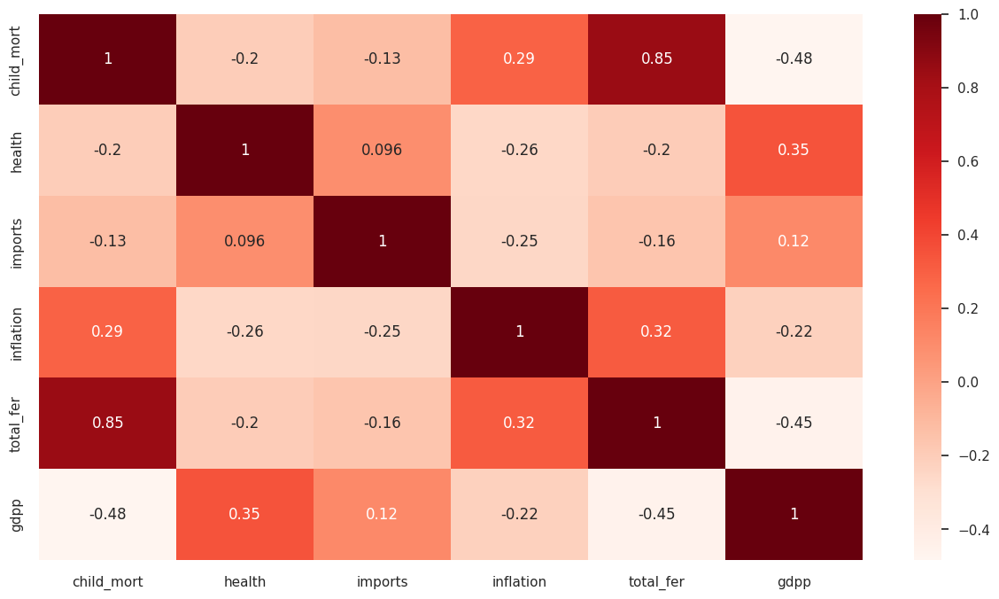

In [ ]:
plt.figure(figsize=(15,8))
core1 = df_n.corr()
sns.heatmap(core1, annot=True, cmap=plt.cm.Reds)
plt.show()
#heatmap of features after dropping 3 features features

###Without PCA

Repeated the same steps for clustering as done before for data after feature selection

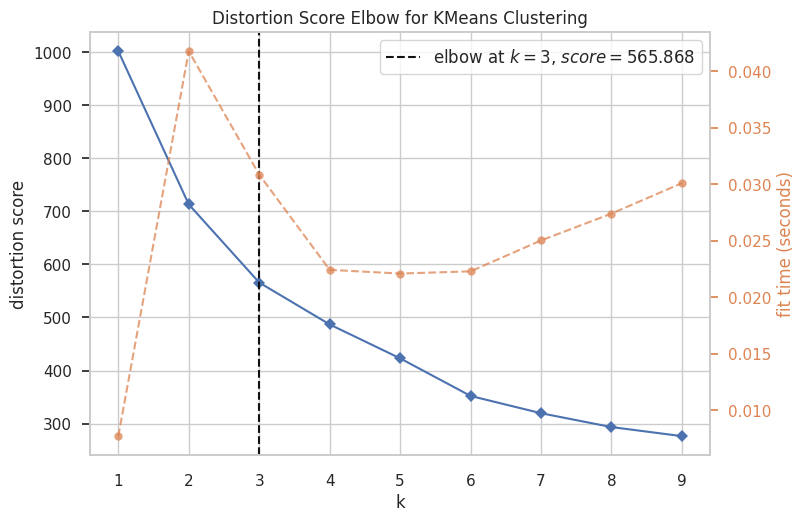

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
model_n = KMeans(n_init=10)
visualize = KElbowVisualizer(model_n, k=(1,10))
visualize.fit(df_n)
visualize.poof()

In [ ]:
kmeans5 = KMeans(n_clusters=3,n_init=10)
df12=df_n.copy()
df12["Cluster"] = kmeans5.fit_predict(df_n)

# df_scaled.head()
df12['country']=y
df12

,child_mort,health,imports,inflation,total_fer,gdpp,Cluster,country
0,1.291532,0.279088,-0.082455,0.157336,1.902882,-0.679180,1,Afghanistan
1,-0.538949,-0.097016,0.070837,-0.312347,-0.859973,-0.485623,0,Albania
2,-0.272833,-0.966073,-0.641762,0.789274,-0.038404,-0.465376,0,Algeria
3,2.007808,-1.448071,-0.165315,1.387054,2.128151,-0.516268,1,Angola
4,-0.695634,-0.286894,0.497568,-0.601749,-0.541946,-0.041817,0,Antigua and Barbuda
...,...,...,...,...,...,...,...,...
162,-0.225578,-0.571711,0.240700,-0.489784,0.365754,-0.546913,0,Vanuatu
163,-0.526514,-0.695862,-1.213499,3.616865,-0.316678,0.029323,0,Venezuela
164,-0.372315,0.008877,1.380030,0.409732,-0.661206,-0.637754,0,Vietnam
165,0.448417,-0.597272,-0.517472,1.500916,1.140944,-0.637754,1,Yemen


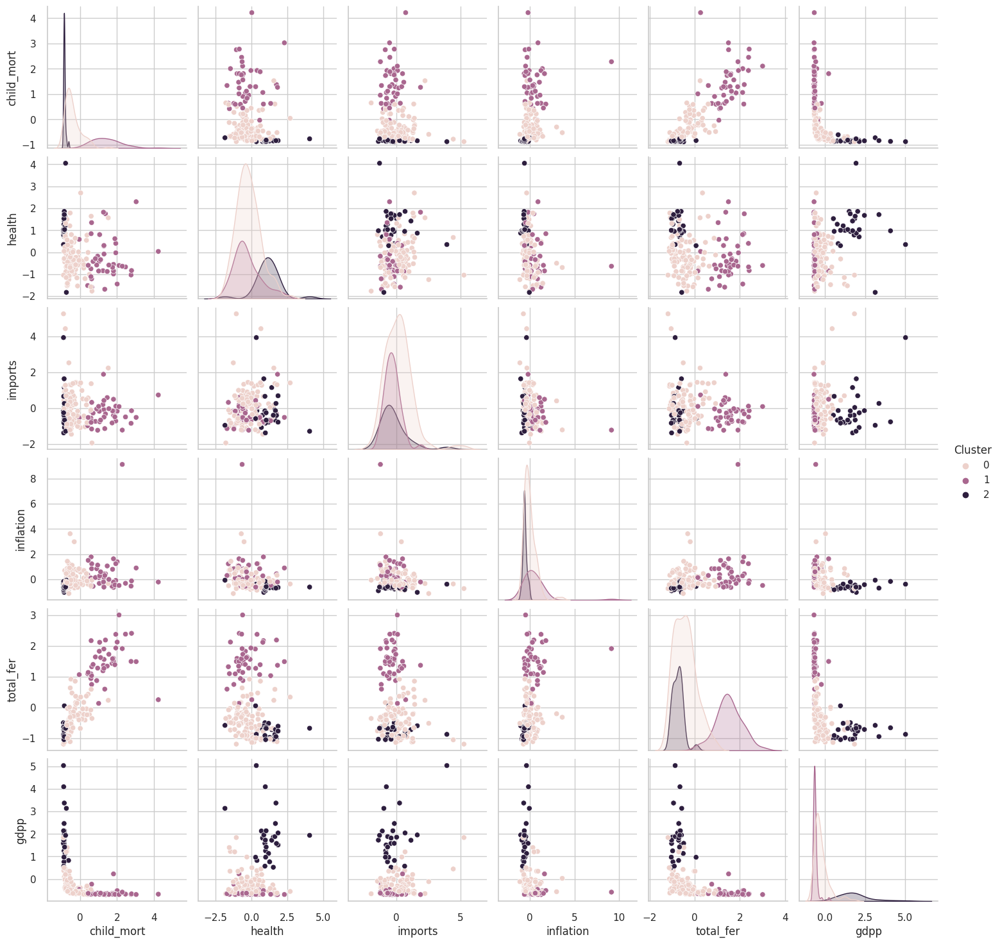

In [ ]:
sns.set(style="whitegrid")
sns.pairplot(df12.drop(['country'],axis=1), hue='Cluster')

In [ ]:
umap_2d2=UMAP(n_components=2,init='random',random_state=0)
umap_3d2=UMAP(n_components=3,init='random',random_state=0)
proj_2d2=umap_2d2.fit_transform(df_scaled)
# proj_3d2=umap_3d2.fit_transform(df)
fig_2d2=px.scatter(proj_2d2,x=0,y=1,color=df12.Cluster)
# fig_3d2=px.scatter_3d(proj_3d2,x=0,y=1,z=2,color=df10.Cluster)

In [ ]:
fig_2d2.show()

In [ ]:
from sklearn.metrics import silhouette_samples, silhouette_score
score1= silhouette_score(df_scaled, kmeans5.labels_, metric='euclidean')
print(score1)
Result['KMeans_corr_features_rem_no_pca'] = score1

0.2814918415101626


###With PCA

Applying PCA on the reduced data after feature selection and then applying KMeans

In [ ]:
df_pc1=df_n.copy()
pca5=PCA()
# lot3 = list(zip(df_scaled['gdpp'],df_scaled['income']))
# d3=pd.DataFrame(lot3)
pca_data5 = pca5.fit_transform(df_pc1)
print(pca_data5.shape)
df_pc1=pd.DataFrame(pca_data5)
df_pc1
# pca_data3=pca_data3.reshape(2,167)
# pca_data3[1]

(167, 6)


,0,1,2,3,4,5
0,1.984514,-1.039635,0.794129,-0.027228,0.129910,-0.438576
1,-0.622796,0.218792,-0.593688,-0.447646,-0.593023,0.193819
2,0.719431,1.164486,-0.590390,-0.011731,-0.125498,-0.150143
3,3.357534,-0.148790,-0.156483,0.774485,0.976230,-0.049944
4,-0.858748,-0.139523,-0.778147,-0.289125,-0.074047,-0.140856
...,...,...,...,...,...,...
162,0.268504,-0.309950,-0.694751,-0.500438,0.025699,-0.454437
163,1.217258,3.032368,0.058470,2.042860,-0.749600,-0.036141
164,-0.405867,-0.492792,-1.065803,0.743733,-0.966812,0.153665
165,1.915265,0.685700,0.055176,0.641575,-0.153365,-0.458492


[0.43213852 0.60951416 0.76617629 0.88576844 0.97503769 1.        ]


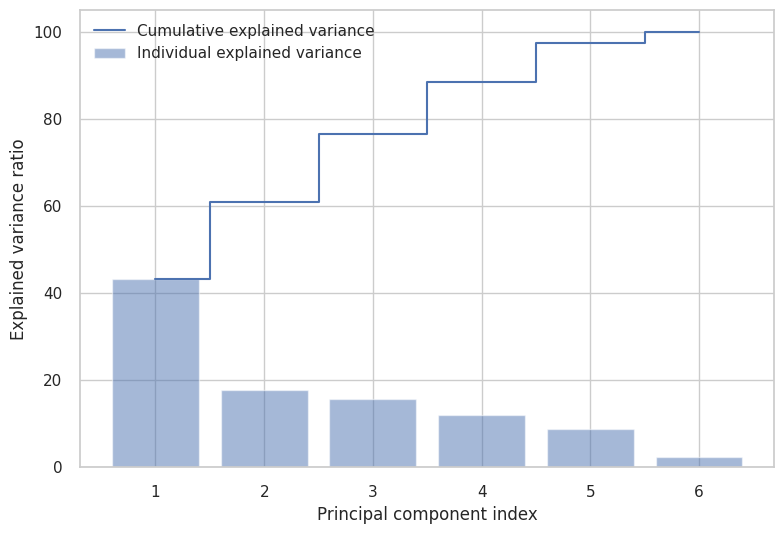

In [ ]:
exp_var_pca = pca5.explained_variance_ratio_
#
# Cumulative sum of eigenvalues; This will be used to create step plot
# for visualizing the variance explained by each principal component.
#
cum_sum_eigenvalues = np.cumsum(exp_var_pca)
print(cum_sum_eigenvalues)
#
# Create the visualization plot
#
plt.bar(range(1,len(exp_var_pca)+1), exp_var_pca*100, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(1,len(cum_sum_eigenvalues)+1), cum_sum_eigenvalues*(100), where='mid',label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

In [ ]:
df_pc1=df_n.copy()
pca5=PCA(n_components=5)
# lot3 = list(zip(df_scaled['gdpp'],df_scaled['income']))
# d3=pd.DataFrame(lot3)
pca_data5 = pca5.fit_transform(df_pc1)
# print(np.cumsum(pca5.explained_variance_ratio_))
print(pca_data5.shape)
df_pc1=pd.DataFrame(pca_data5)
df_pc1

(167, 5)


,0,1,2,3,4
0,1.984514,-1.039635,0.794129,-0.027228,0.129910
1,-0.622796,0.218792,-0.593688,-0.447646,-0.593023
2,0.719431,1.164486,-0.590390,-0.011731,-0.125498
3,3.357534,-0.148790,-0.156483,0.774485,0.976230
4,-0.858748,-0.139523,-0.778147,-0.289125,-0.074047
...,...,...,...,...,...
162,0.268504,-0.309950,-0.694751,-0.500438,0.025699
163,1.217258,3.032368,0.058470,2.042860,-0.749600
164,-0.405867,-0.492792,-1.065803,0.743733,-0.966812
165,1.915265,0.685700,0.055176,0.641575,-0.153365


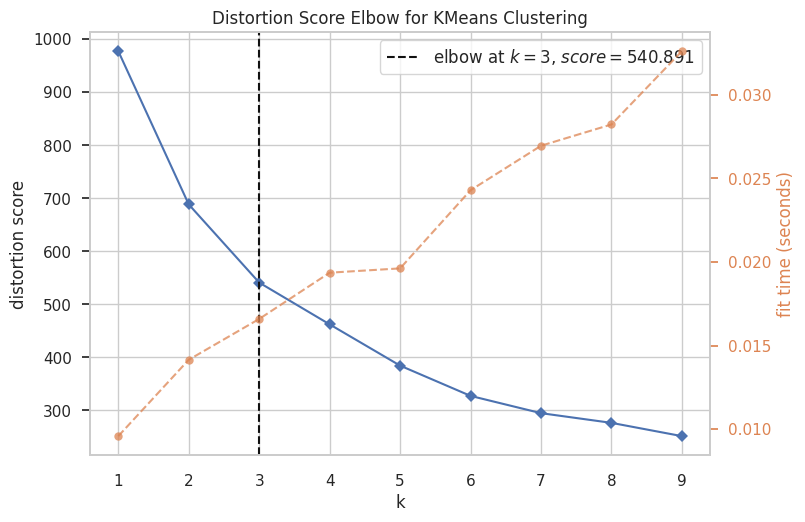

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
model_np = KMeans(n_init=10)
visualize = KElbowVisualizer(model_np, k=(1,10))
visualize.fit(df_pc1)
visualize.poof()

In [ ]:
kmeans6 = KMeans(n_clusters=3,n_init=10)
df13=df_pc1.copy()
df13["Cluster"] = kmeans6.fit_predict(df_pc1)

# df_scaled.head()
df13['country']=y
df13

,0,1,2,3,4,Cluster,country
0,1.984514,-1.039635,0.794129,-0.027228,0.129910,1,Afghanistan
1,-0.622796,0.218792,-0.593688,-0.447646,-0.593023,0,Albania
2,0.719431,1.164486,-0.590390,-0.011731,-0.125498,0,Algeria
3,3.357534,-0.148790,-0.156483,0.774485,0.976230,1,Angola
4,-0.858748,-0.139523,-0.778147,-0.289125,-0.074047,0,Antigua and Barbuda
...,...,...,...,...,...,...,...
162,0.268504,-0.309950,-0.694751,-0.500438,0.025699,0,Vanuatu
163,1.217258,3.032368,0.058470,2.042860,-0.749600,0,Venezuela
164,-0.405867,-0.492792,-1.065803,0.743733,-0.966812,0,Vietnam
165,1.915265,0.685700,0.055176,0.641575,-0.153365,1,Yemen


In [ ]:
from sklearn.metrics import silhouette_samples, silhouette_score
score1= silhouette_score(df_scaled, kmeans6.labels_, metric='euclidean')
print(score1)
Result['KMeans_corr_features_rem_pca'] = score1

0.28499474090055743


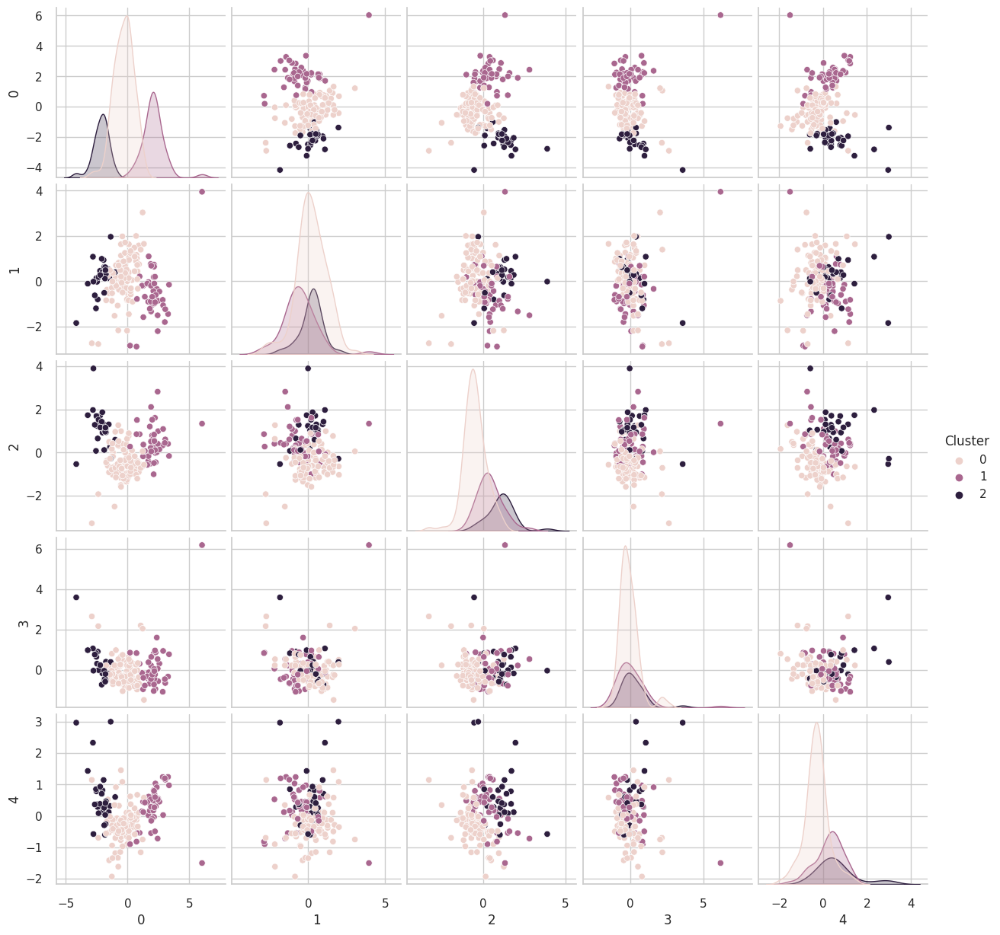

In [ ]:
sns.set(style="whitegrid")
sns.pairplot(df13.drop(['country'],axis=1), hue='Cluster')

In [ ]:
umap_2d2=UMAP(n_components=2,init='random',random_state=0)
umap_3d2=UMAP(n_components=3,init='random',random_state=0)
proj_2d2=umap_2d2.fit_transform(df_scaled)
# proj_3d2=umap_3d2.fit_transform(df)
fig_2d2=px.scatter(proj_2d2,x=0,y=1,color=df13.Cluster)
# fig_3d2=px.scatter_3d(proj_3d2,x=0,y=1,z=2,color=df10.Cluster)
fig_2d2.show()

#Hierarchical

##On normal scaled data

Applying hierarchical clustering on scaled data

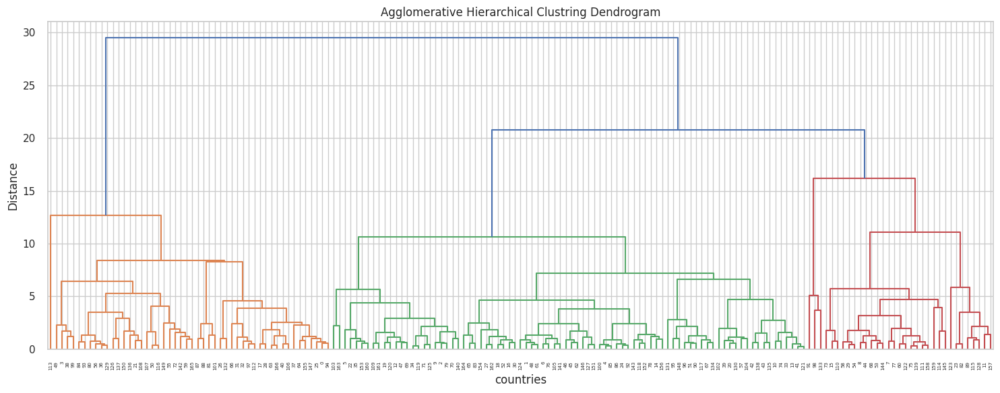

In [ ]:
from scipy.cluster.hierarchy import linkage, cophenet, dendrogram
from scipy.spatial.distance import pdist
link1 = linkage(df_pc, metric = 'euclidean', method = 'ward')
c, coph_dist = cophenet(link1, pdist(df_scaled))

plt.figure(figsize = (15,6))
plt.title('Agglomerative Hierarchical Clustring Dendrogram')
plt.xlabel('countries')
plt.ylabel('Distance')
dendrogram(link1)
plt.tight_layout()
#Plotting the dendrogram using agglomerative method for hierarchical clustering

In [ ]:
from sklearn.cluster import AgglomerativeClustering as agc
modelAGC1 = agc(n_clusters = 3, metric = 'euclidean', linkage = 'ward')
p1 = modelAGC1.fit_predict(df_scaled)
score_hr1= silhouette_score(df_scaled, p1, metric='euclidean')
print(score_hr1)
df_hc1=df_scaled.copy()
df_hc1['Cluster']=p1
Result['Hierarchical_normal_scaled'] = score_hr1
#clustering the data for n_clusters = 3 according to the dendrogram we got above

0.24563001303300652


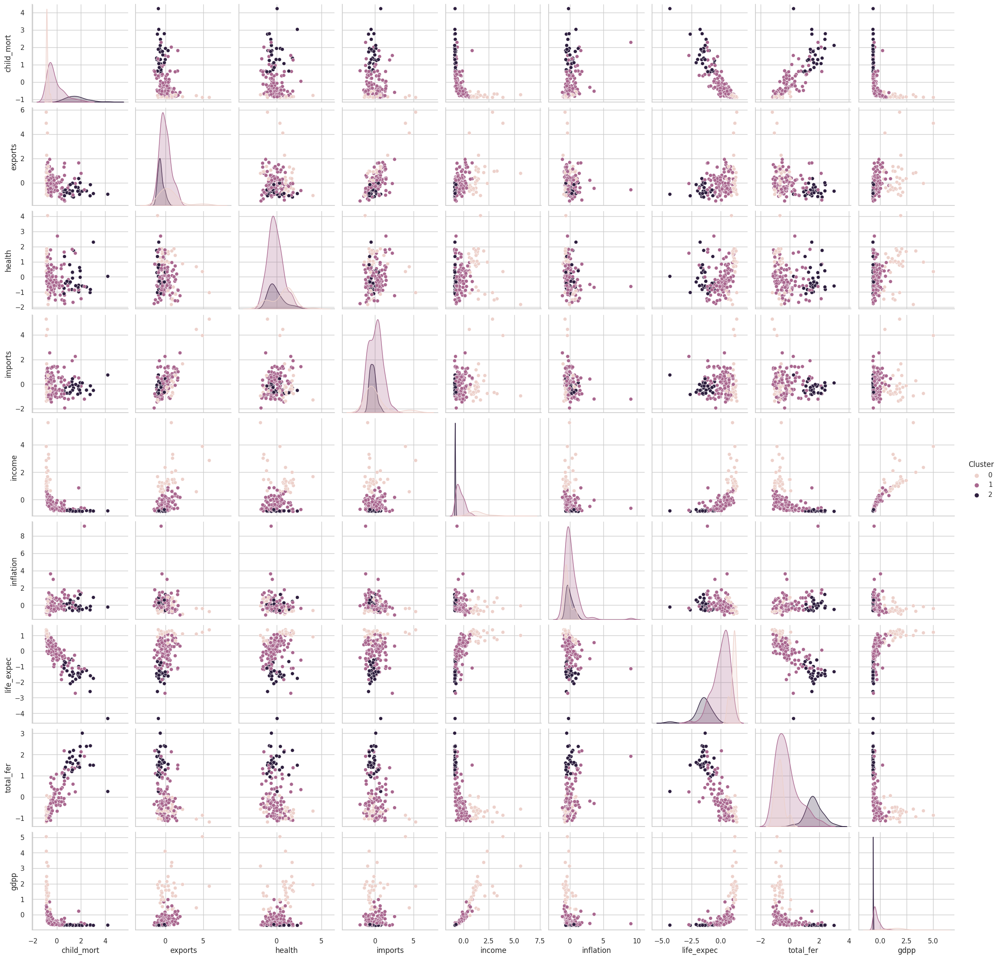

In [ ]:
sns.set(style="whitegrid")
sns.pairplot(df_hc1, hue='Cluster');

In [ ]:
umap_2d2=UMAP(n_components=2,init='random',random_state=0)
umap_3d2=UMAP(n_components=3,init='random',random_state=0)
proj_2d2=umap_2d2.fit_transform(df_scaled)
proj_3d2=umap_3d2.fit_transform(df_scaled)
fig_2d2=px.scatter(proj_2d2,x=0,y=1,color=df_hc1.Cluster)
fig_3d2=px.scatter_3d(proj_3d2,x=0,y=1,z=2,color=df10.Cluster)

In [ ]:
fig_2d2.show()

##On PCA data

Plotting dendogram and making clusters for transformed data after applying PCA as done before

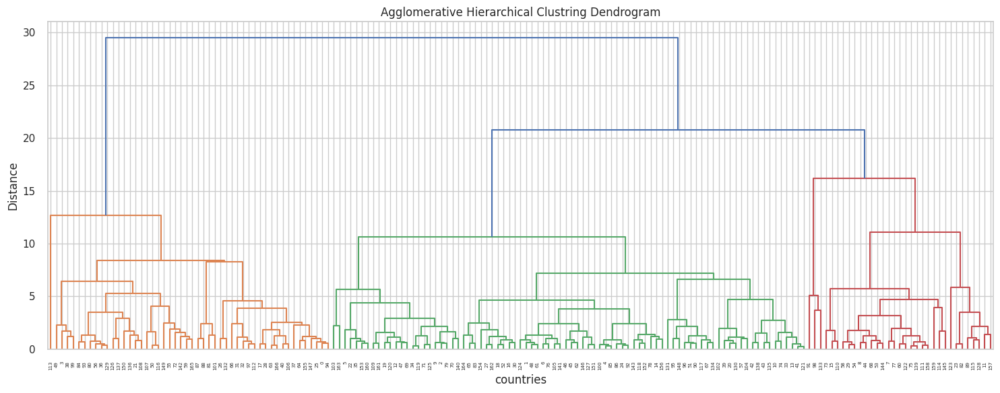

In [ ]:
from scipy.cluster.hierarchy import linkage, cophenet, dendrogram
from scipy.spatial.distance import pdist
#using the PCA data that was computed before for this part
link = linkage(df_pc, metric = 'euclidean', method = 'ward')
c, coph_dist = cophenet(link, pdist(df_pc))

plt.figure(figsize = (15,6))
plt.title('Agglomerative Hierarchical Clustring Dendrogram')
plt.xlabel('countries')
plt.ylabel('Distance')
dendrogram(link)
plt.tight_layout()
#Plotting the dendogram using agglomerative method for hierarchical clustering

In [ ]:
from sklearn.cluster import AgglomerativeClustering as agc
modelAGC = agc(n_clusters = 3, metric = 'euclidean', linkage = 'ward')
p = modelAGC.fit_predict(df_pc)
score_hr= silhouette_score(df_scaled, p, metric='euclidean')
print(score_hr)
Result['Hierarchical_normal_scaled_pca'] = score_hr
df_hc=df_scaled.copy()
df_hc['Cluster']=p
#doing agglomerative clustering for n_clusters = 3

0.28020944605416703


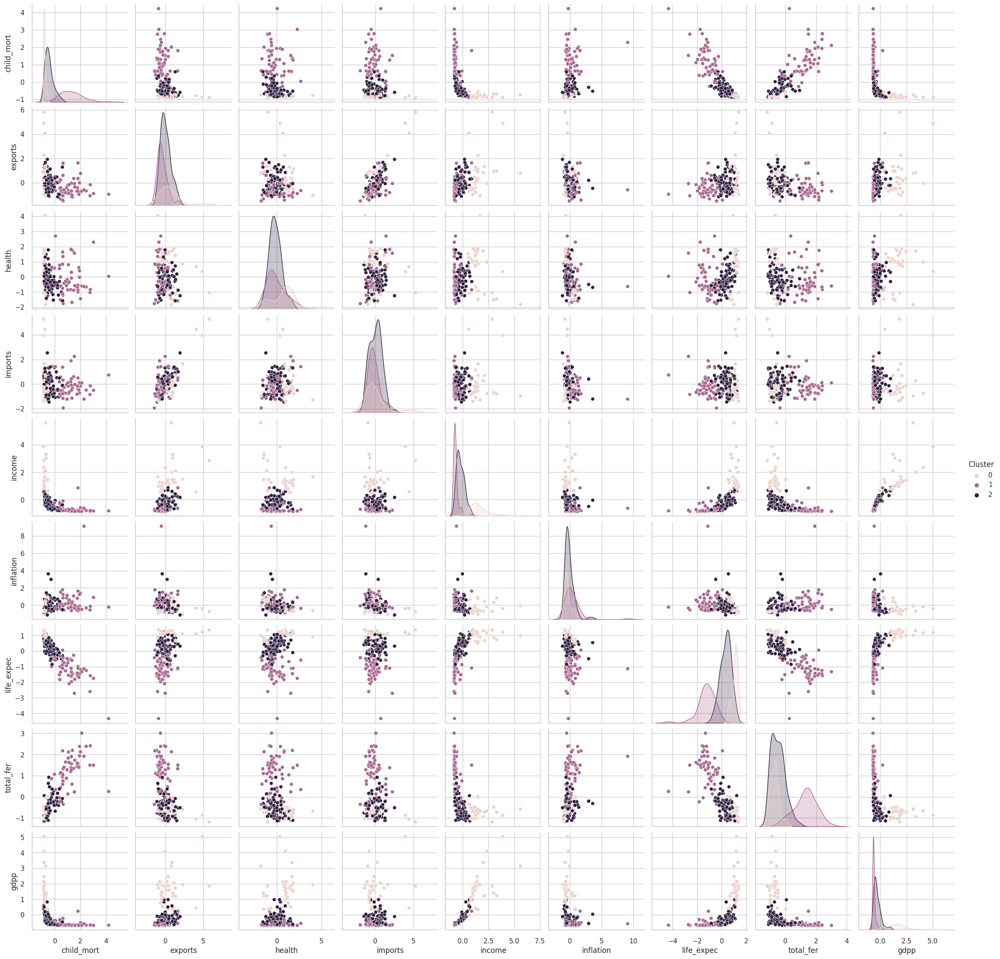

In [ ]:
sns.set(style="whitegrid")
sns.pairplot(df_hc, hue='Cluster');

In [ ]:
umap_2d2=UMAP(n_components=2,init='random',random_state=0)
# umap_3d2=UMAP(n_components=3,init='random',random_state=0)
proj_2d2=umap_2d2.fit_transform(df_scaled)
# proj_3d2=umap_3d2.fit_transform(df_scaled)
fig_2d2=px.scatter(proj_2d2,x=0,y=1,color=df_hc.Cluster)
# fig_3d2=px.scatter_3d(proj_3d2,x=0,y=1,z=2,color=df10.Cluster)

In [ ]:
fig_2d2.show()

##Data after removing corelated features(Feature Selection)

###Without PCA

Applying hierarchical clustering as done before for data after feature selection

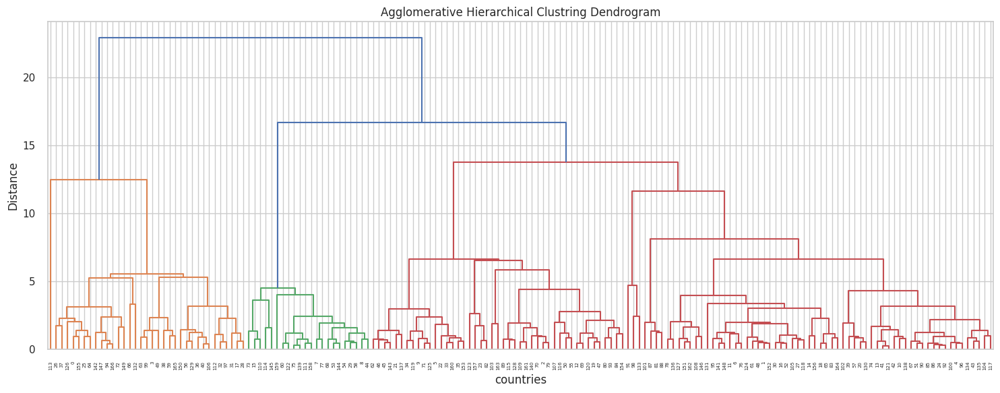

In [ ]:
from scipy.cluster.hierarchy import linkage, cophenet, dendrogram
from scipy.spatial.distance import pdist

link = linkage(df_n, metric = 'euclidean', method = 'ward')
c, coph_dist = cophenet(link, pdist(df_n))

plt.figure(figsize = (15,6))
plt.title('Agglomerative Hierarchical Clustring Dendrogram')
plt.xlabel('countries')
plt.ylabel('Distance')
dendrogram(link)
plt.tight_layout()

In [ ]:
from sklearn.cluster import AgglomerativeClustering as agc
modelAGCn = agc(n_clusters = 3, metric = 'euclidean', linkage = 'ward')
pn = modelAGCn.fit_predict(df_n)
score_hrn= silhouette_score(df_scaled, pn, metric='euclidean')
print(score_hrn)
Result['Hierarchical_corr_features_rem_no_pca'] = score_hrn
df_hcn=df_scaled.copy()
df_hcn['Cluster']=pn

0.24419332845508804


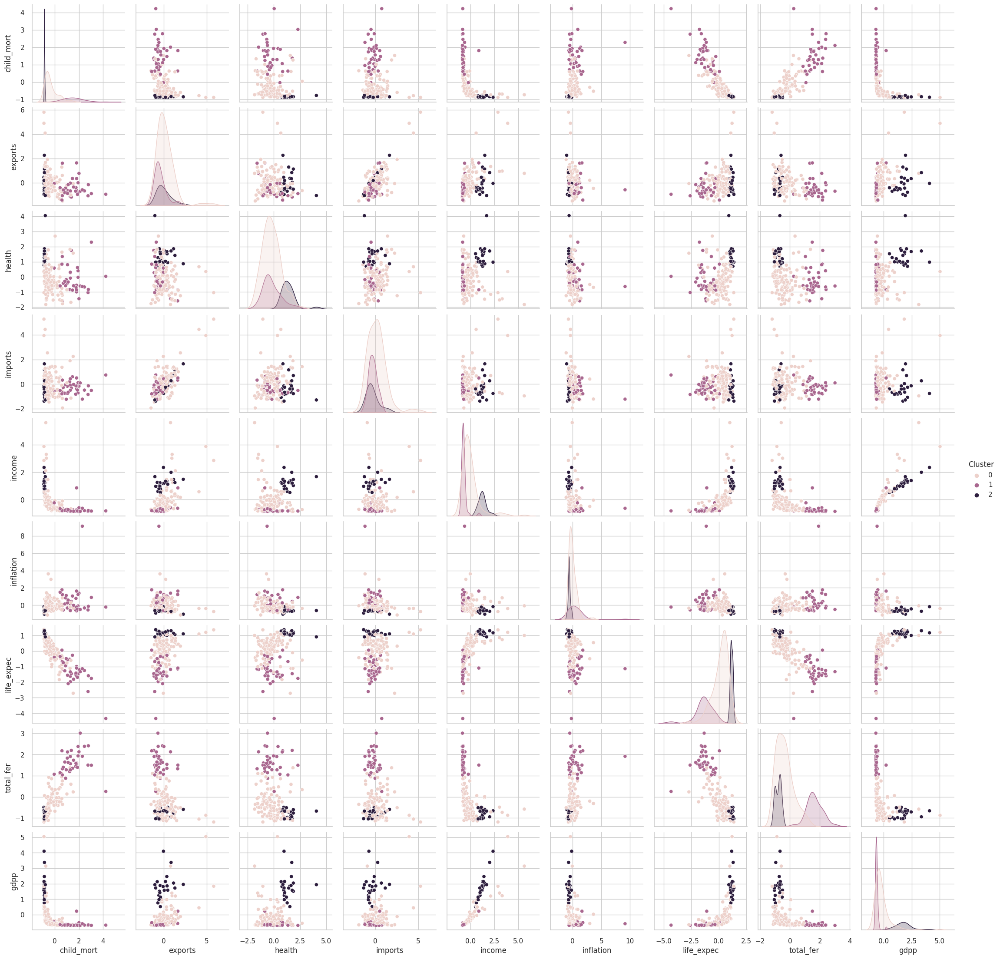

In [ ]:
sns.set(style="whitegrid")
sns.pairplot(df_hcn, hue='Cluster');

In [ ]:
umap_2d2=UMAP(n_components=2,init='random',random_state=0)
# umap_3d2=UMAP(n_components=3,init='random',random_state=0)
proj_2d2=umap_2d2.fit_transform(df_scaled)
# proj_3d2=umap_3d2.fit_transform(df_scaled)
fig_2d2=px.scatter(proj_2d2,x=0,y=1,color=df_hcn.Cluster)
# fig_3d2=px.scatter_3d(proj_3d2,x=0,y=1,z=2,color=df10.Cluster)
fig_2d2.show()

###With PCA

Applying Hierarchical Clustering on data that was transformed using PCA after feature selction was done



In [ ]:
df_pcn1=df_pc1.copy()

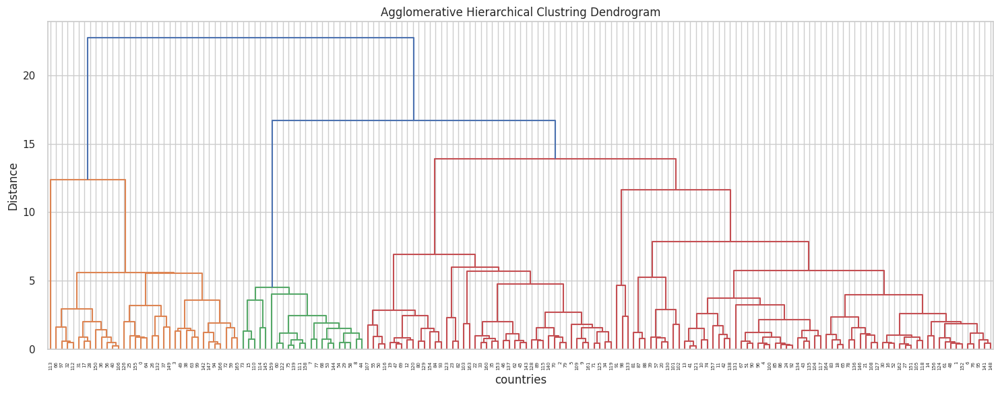

In [ ]:
from scipy.cluster.hierarchy import linkage, cophenet, dendrogram
from scipy.spatial.distance import pdist

link = linkage(df_pcn1, metric = 'euclidean', method = 'ward')
c, coph_dist = cophenet(link, pdist(df_pcn1))

plt.figure(figsize = (15,6))
plt.title('Agglomerative Hierarchical Clustring Dendrogram')
plt.xlabel('countries')
plt.ylabel('Distance')
dendrogram(link)
plt.tight_layout()

In [ ]:
from sklearn.cluster import AgglomerativeClustering as agc
modelAGCn1 = agc(n_clusters = 3, metric = 'euclidean', linkage = 'ward')
pn1 = modelAGCn1.fit_predict(df_pcn1)
score_hrn= silhouette_score(df_scaled, pn1, metric='euclidean')
print(score_hrn)
Result['Hierarchical_corr_features_rem_pca'] = score_hrn
df_hcn1=df_scaled.copy()
df_hcn1['Cluster']=pn1

0.2413142298491411


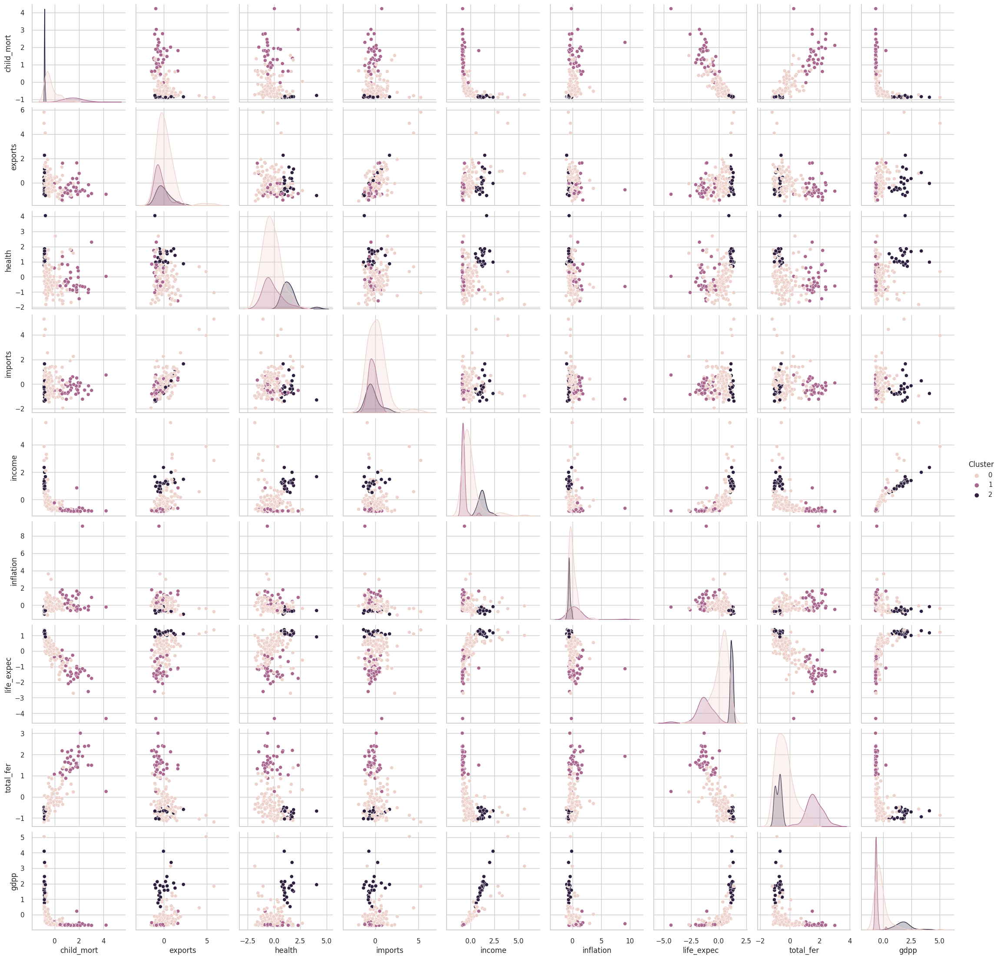

In [ ]:
sns.set(style="whitegrid")
sns.pairplot(df_hcn1, hue='Cluster');

In [ ]:
umap_2d2=UMAP(n_components=2,init='random',random_state=0)
# umap_3d2=UMAP(n_components=3,init='random',random_state=0)
proj_2d2=umap_2d2.fit_transform(df_scaled)
# proj_3d2=umap_3d2.fit_transform(df_scaled)
fig_2d2=px.scatter(proj_2d2,x=0,y=1,color=df_hcn1.Cluster)
# fig_3d2=px.scatter_3d(proj_3d2,x=0,y=1,z=2,color=df10.Cluster)
fig_2d2.show()

#Final Visualisation of best Clusters

In [ ]:
Result

{'KMeans_Normal_Scaled': 0.22595133318635627,
 'KMeans_Normal_Scaled_pca': 0.28329575683463126,
 'KMeans_corr_features_rem_no_pca': 0.2814918415101626,
 'KMeans_corr_features_rem_pca': 0.28499474090055743,
 'Hierarchical_normal_scaled': 0.24563001303300652,
 'Hierarchical_normal_scaled_pca': 0.28020944605416703,
 'Hierarchical_corr_features_rem_no_pca': 0.24419332845508804,
 'Hierarchical_corr_features_rem_pca': 0.2413142298491411}

In [ ]:
df_f=dt.copy()
df_f['Cluster']=df10.Cluster
df_f
dff1=df_f.loc[df_f.Cluster == 0].copy()
dff2=df_f.loc[df_f.Cluster == 1].copy()
dff3=df_f.loc[df_f.Cluster == 2].copy()
dff1
#separating the data according to the clusters assigned

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,Cluster
7,Australia,4.8,19.8,8.73,20.9,41400,1.160,82.0,1.93,51900,0
8,Austria,4.3,51.3,11.00,47.8,43200,0.873,80.5,1.44,46900,0
11,Bahrain,8.6,69.5,4.97,50.9,41100,7.440,76.0,2.16,20700,0
15,Belgium,4.5,76.4,10.70,74.7,41100,1.880,80.0,1.86,44400,0
23,Brunei,10.5,67.4,2.84,28.0,80600,16.700,77.1,1.84,35300,0
29,Canada,5.6,29.1,11.30,31.0,40700,2.870,81.3,1.63,47400,0
42,Cyprus,3.6,50.2,5.97,57.5,33900,2.010,79.9,1.42,30800,0
43,Czech Republic,3.4,66.0,7.88,62.9,28300,-1.430,77.5,1.51,19800,0
44,Denmark,4.1,50.5,11.40,43.6,44000,3.220,79.5,1.87,58000,0
53,Finland,3.0,38.7,8.95,37.4,39800,0.351,80.0,1.87,46200,0


In [ ]:
dff3

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,Cluster
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,2
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,2
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,2
5,Argentina,14.5,18.9,8.10,16.0,18700,20.90,75.8,2.37,10300,2
6,Armenia,18.1,20.8,4.40,45.3,6700,7.77,73.3,1.69,3220,2
...,...,...,...,...,...,...,...,...,...,...,...
160,Uruguay,10.6,26.3,8.35,25.4,17100,4.91,76.4,2.08,11900,2
161,Uzbekistan,36.3,31.7,5.81,28.5,4240,16.50,68.8,2.34,1380,2
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970,2
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500,2


In [ ]:
dff2

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,Cluster
0,Afghanistan,90.2,10.00,7.58,44.9,1610,9.440,56.2,5.82,553,1
3,Angola,119.0,62.30,2.85,42.9,5900,22.400,60.1,6.16,3530,1
17,Benin,111.0,23.80,4.10,37.2,1820,0.885,61.8,5.36,758,1
21,Botswana,52.5,43.60,8.30,51.3,13300,8.920,57.1,2.88,6350,1
25,Burkina Faso,116.0,19.20,6.74,29.6,1430,6.810,57.9,5.87,575,1
26,Burundi,93.6,8.92,11.60,39.2,764,12.300,57.7,6.26,231,1
28,Cameroon,108.0,22.20,5.13,27.0,2660,1.910,57.3,5.11,1310,1
31,Central African Republic,149.0,11.80,3.98,26.5,888,2.010,47.5,5.21,446,1
32,Chad,150.0,36.80,4.53,43.5,1930,6.390,56.5,6.59,897,1
36,Comoros,88.2,16.50,4.51,51.7,1410,3.870,65.9,4.75,769,1


In [ ]:
cm=[]

In [ ]:
%%capture --no-display
dff1.mean()
cm.append(dff1.mean()['child_mort'])
dff2.mean()
cm.append(dff2.mean()['child_mort'])
dff3.mean()
cm.append(dff3.mean()['child_mort'])
#appending the mean of child mortality rate of the data in each cluster to th list cm

In [ ]:
cm

[4.999999999999999, 92.96170212765959, 21.92738095238095]

In [ ]:
cma=np.array(cm).argsort()
cma#sorting the list so that clusters can be assigned based on the development of the country
#developed country would have cluster=0
#developing would have cluster=1
#and underdeveloped would have cluster=2

array([0, 2, 1])

In [ ]:
nc=[]

In [ ]:
for i in df_f['Cluster']:
  # print(i,cma[i])
  nc.append(cma[i])


In [ ]:
df_f['Cluster1']=nc

In [ ]:
df_f

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,Cluster,Cluster1
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,1,2
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,2,1
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,2,1
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,1,2
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970,2,1
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500,2,1
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310,2,1
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310,1,2


In [ ]:
df_f.Cluster1.value_counts()

1    84
2    47
0    36
Name: Cluster1, dtype: int64

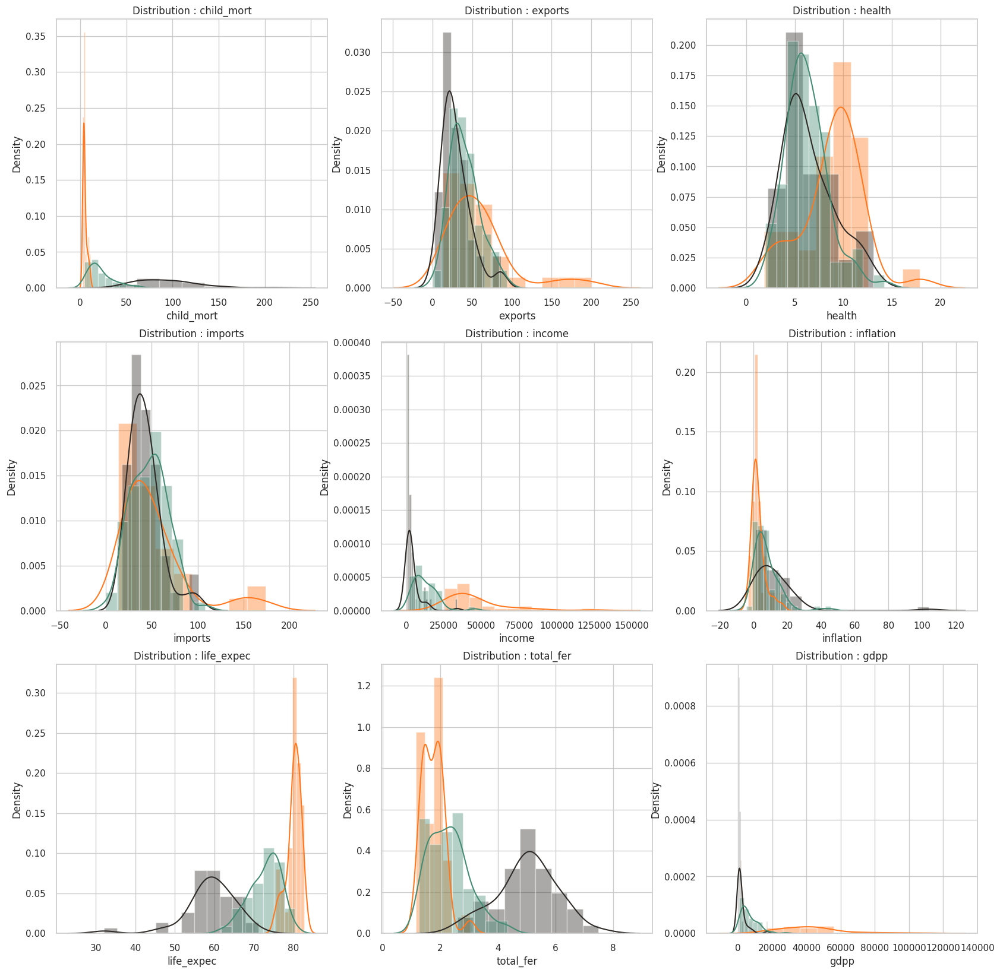

In [ ]:
%%capture --no-display
fig, ax = plt.subplots(nrows = 3,ncols = 3,figsize = (20,20))

for i in range(1,10):
    plt.subplot(3,3,i)
    sns.distplot(dff1[dff1.columns[i]],color = colors[0])
    sns.distplot(dff2[dff2.columns[i]],color = colors[1])
    sns.distplot(dff3[dff3.columns[i]],color = colors[2])
    title = 'Distribution : ' + dff1.columns[i]
    plt.title(title)
plt.show()
#Plotting Class-wise distribution with different features

In [ ]:
df_f['Cluster1'].loc[df_f['Cluster1'] == 0] = 'No Help Needed'
df_f['Cluster1'].loc[df_f['Cluster1'] == 1] = 'Might Need Help'
df_f['Cluster1'].loc[df_f['Cluster1'] == 2] = 'Help Needed'

fig = px.choropleth(df_f[['country','Cluster1']],
                    locationmode = 'country names',
                    locations = 'country',
                    title = 'Needed Help Per Country (World)',
                    color = df_f['Cluster1'],
                    color_discrete_map = {'Might Need Help':'Yellow',
                                        'No Help Needed':'Green',
                                        'Help Needed':'Red'}
                   )
fig.update_geos(fitbounds = "locations", visible = True)
fig.update_layout(legend_title_text = 'Labels',legend_title_side = 'top',title_pad_l = 260,title_y = 0.86)
fig.show(engine = 'kaleido')
#Making a map to visualize the countries according to the help needed by them

<ipython-input-231-d487943b7f9c>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



#Decision Tree

In [ ]:
df_f

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,Cluster,Cluster1
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,1,Help Needed
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,2,Might Need Help
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,2,Might Need Help
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,1,Help Needed
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,2,Might Need Help
...,...,...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970,2,Might Need Help
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500,2,Might Need Help
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310,2,Might Need Help
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310,1,Help Needed


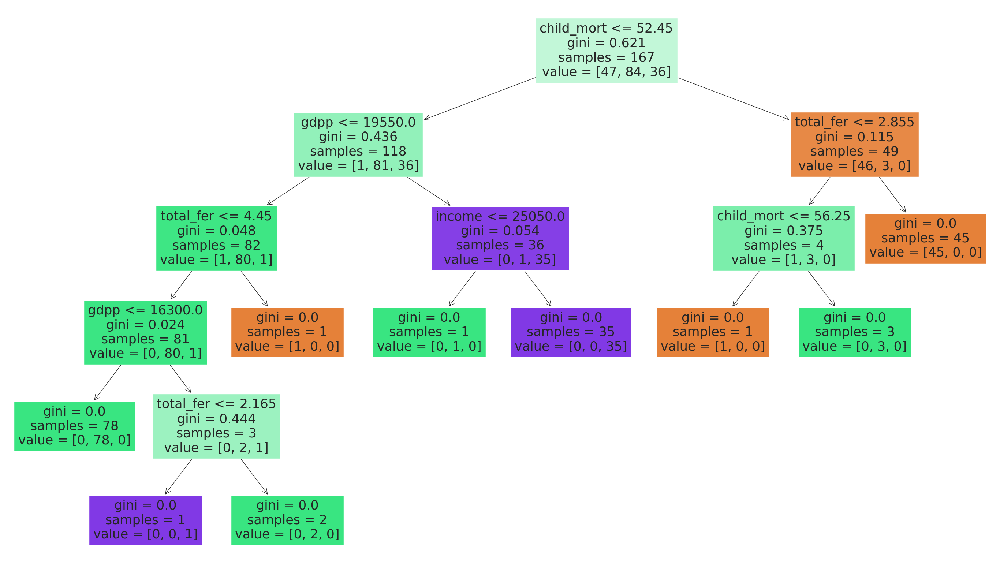

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree
clf = DecisionTreeClassifier(random_state=0)
tree=clf.fit(df_f.drop(['Cluster1','Cluster','country'],axis=1),df_f.Cluster1)
fig = plt.figure(figsize=(35,20))
_ = plot_tree(tree, feature_names=df.columns, filled=True)
#plotting the decision tree to understand how different features contributed in clustering.

In [ ]:
print(Result)

{'KMeans_Normal_Scaled': 0.22595133318635627, 'KMeans_Normal_Scaled_pca': 0.28329575683463126, 'KMeans_corr_features_rem_no_pca': 0.2814918415101626, 'KMeans_corr_features_rem_pca': 0.28499474090055743, 'Hierarchical_normal_scaled': 0.24563001303300652, 'Hierarchical_normal_scaled_pca': 0.28020944605416703, 'Hierarchical_corr_features_rem_no_pca': 0.24419332845508804, 'Hierarchical_corr_features_rem_pca': 0.2413142298491411}
